In [1]:
import pickle
import numpy as np

# Replace 'your_file.dat' with the path to your .dat file
file_path = '/home/mohan/Downloads/data_preprocessed_python/s01.dat'

# Open the file in binary read mode
with open(file_path, 'rb') as file:
    # Load the data using pickle
    data = pickle.load(file,encoding='latin1')

# Now, 'data' contains the data from the .dat file
array = np.array(data)

# plotting the signal for each channel [subject 01]

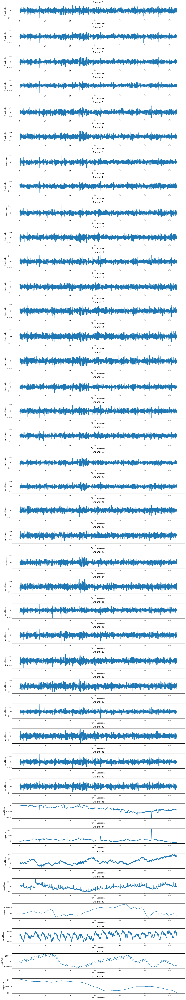

In [2]:
signal = data['data']
signal[0].shape

import matplotlib.pyplot as plt
import numpy as np

# Assuming `eeg_data` is your EEG data in a NumPy array or a Pandas DataFrame
# The shape of eeg_data should now be (32, n_samples) where 32 is the number of channels

# For demonstration, let's create some sample EEG data
num_channels = 40
num_samples = 8064  # Example number of samples
eeg_data = signal[0]

time = np.arange(num_samples) / 128

# Create a figure and subplots
fig, axs = plt.subplots(num_channels, 1, figsize=(15, 2 * num_channels))

# Iterate over each channel
for i in range(num_channels):
    axs[i].plot(time, eeg_data[i, :])
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_ylabel('Amplitude')
    axs[i].set_xlabel('Time in seconds')

plt.tight_layout()
plt.show() 


# Topographical plots across the time. 
Requires mne library.

The MNE-Python library to create an `Info` object, which is a fundamental data structure in MNE (Magnetoencephalography and Electroencephalography) for storing information about the data.


- `mne`: This is the MNE-Python library, which is commonly imported as `import mne`.

- `create_info`: This is a function in MNE-Python used to create an `Info` object.


So, overall, the below code is creating an `Info` object that contains metadata about the EEG data, such as channel names, sampling frequency, and channel types. This `Info` object is a crucial part of MNE-Python's data structure and is typically used when working with EEG or MEG data to store information about the recording setup.

In [3]:
!pip install mne
import mne
import numpy as np
eeg_channels = (["Fp1", "AF3", "F3", "F7", "FC5", "FC1", "C3", "T7", "CP5", "CP1", "P3", "P7", "PO3", "O1", "Oz", "Pz", "Fp2", "AF4", "Fz", "F4", "F8", "FC6", "FC2", "Cz", "C4", "T8", "CP6", "CP2", "P4", "P8", "PO4", "O2"])
ch_types = ['eeg'] * len(eeg_channels)  # Assuming all channels are EEG
sfreq = 128  # Replace with your actual sampling frequency
info = mne.create_info(ch_names=eeg_channels, sfreq=sfreq, ch_types=ch_types)



### Here we are slecting the number of channels that is used in the data. 

In [5]:
# If your data is in microvolts, convert to volts
#data = data['data']   # Only if necessary
#k = data[0]
#print(k[32,:].shape)
selected_channels = np.arange(32)  # This selects channels 0 to 31
raw = mne.io.RawArray(eeg_data[np.arange(32),:], info)

Creating RawArray with float64 data, n_channels=32, n_times=8064
    Range : 0 ... 8063 =      0.000 ...    62.992 secs
Ready.


In [6]:
info = mne.create_info(32, sfreq=128)
print(info)

<Info | 7 non-empty values
 bads: []
 ch_names: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, ...
 chs: 32 misc
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


In [7]:
info = mne.create_info(eeg_channels, ch_types=32*['eeg'], sfreq=128)
info.set_montage('standard_1020')
print(info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF3, F3, F7, FC5, FC1, C3, T7, CP5, CP1, P3, P7, PO3, O1, ...
 chs: 32 EEG
 custom_ref_applied: False
 dig: 35 items (3 Cardinal, 32 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


In [ ]:
# plotting the positions of all the electrodes that placed on the scalp. 

Creating RawArray with float64 data, n_channels=32, n_times=8064
    Range : 0 ... 8063 =      0.000 ...    62.992 secs
Ready.


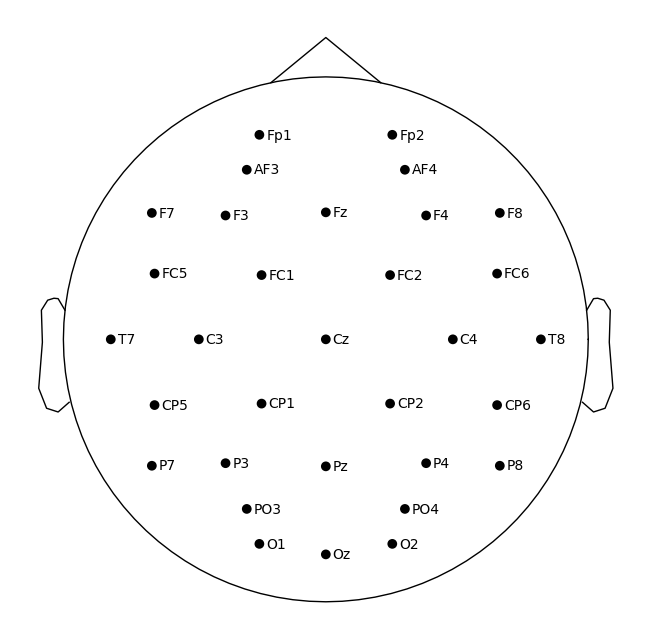

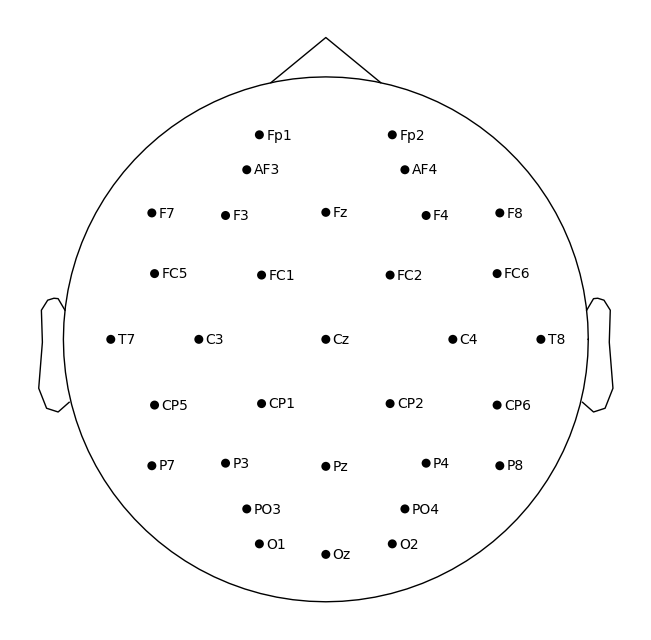

In [8]:
raw_data = mne.io.RawArray(eeg_data[np.arange(32),:], info)
montage = mne.channels.make_standard_montage("biosemi32")
raw_data.set_montage(montage)
montage.plot()

In [ ]:
eeg_data.shape

In [ ]:
# use the below installation line if you are unable to view the raw psd plot. 

In [ ]:
pip install --upgrade mne matplotlib

In [ ]:
### we are plotting the power spectral density plot for the subject 1 of the data. 

NOTE: plot_raw_psd() is a legacy function. New code should use Raw.compute_psd().plot().
Effective window size : 16.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/home/mohan/anaconda3/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


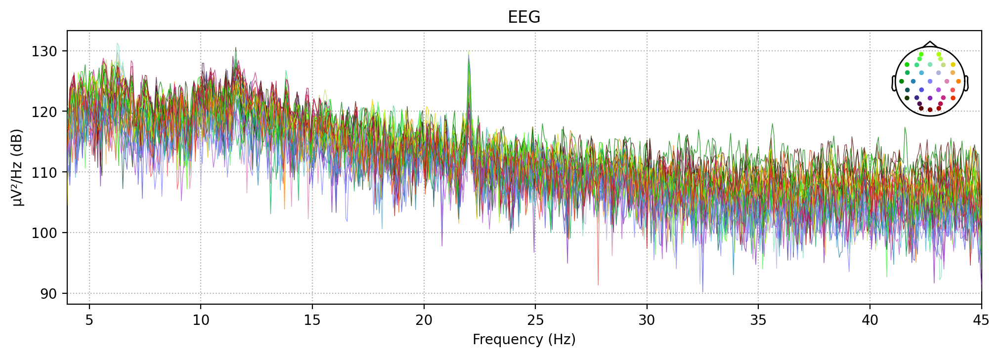

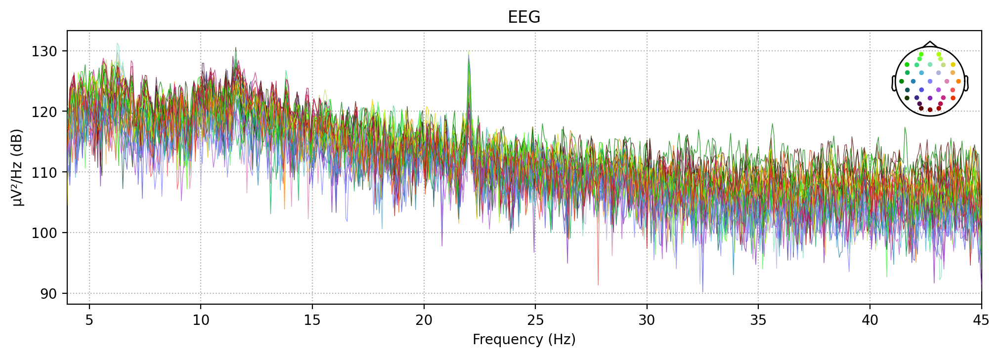

In [9]:
%config InlineBackend.figure_format = 'retina'  # For higher resolution figures

mne.viz.plot_raw_psd(raw_data, fmin = 4, fmax= 45)

- From the above plot we can eaily see the Following. 

1. **Frequency Content:**
   - The x-axis of the plot represents frequency in Hertz (Hz).
   - The y-axis represents the power or amplitude of the signal at each frequency.

2. **Dominant Frequencies:**
   - Peaks in the PSD plot indicate dominant frequencies in the signal.
   - These peaks can correspond to specific neural oscillations such as delta (0.5-4 Hz), theta (4-8 Hz), alpha (8-13 Hz), beta (13-30 Hz), or gamma (>30 Hz).

3. **Artifacts:**
   - Unwanted artifacts, such as line noise or muscle activity, may manifest as peaks at specific frequencies.
   - Identifying these peaks can help in detecting and mitigating artifacts in the data.

4. **Power Changes Over Time:**
   - Changes in power across frequencies can provide insights into dynamic shifts in brain activity.
   - Variations in different frequency bands may correspond to different cognitive states or tasks.

5. **Filtering Considerations:**
   - The plot may help in deciding appropriate frequency ranges for filtering the data based on the analysis goals.

6. **Overall Signal Quality:**
   - The overall shape and smoothness of the PSD plot can provide a qualitative assessment of the signal quality.
   - Abrupt changes or irregularities may indicate potential issues with data recording or preprocessing.

Here, we notice that there is a sharp change in between the 20 and 25 Hz which indicate that there might be a change in the brain signals or it might be noise. In the rest of the plot it can be easily seen that most of the frequences range in the same range. This tells us that it is difficult to figure out an what frequency of waves effect the output. 

**Bands that were used in the paper for analysis theta (4-8 Hz), slow alpha (8-10 Hz), alpha (8-12 Hz), beta(12-30Hz) and gamma (30+ Hz)**

**why are these bands important here - **

The frequency bands in EEG data – Theta, Alpha (both slow and regular), Beta, and Gamma – each have distinct characteristics and are associated with different types of brain activity. Understanding these bands can provide insights into cognitive processes, mental states, and potential neurological conditions. Here's a brief overview of each:

1. **Theta (4-8 Hz)**: 
   - **Characteristics**: Theta waves are typically slow and of high amplitude.
   - **Associated with**: Drowsiness, creativity, meditation, and, in some cases, the early stages of sleep. In children, theta activity is more prominent and can be a normal part of brain development. Excessive theta activity in adults, especially in awake states, might indicate potential neurological issues.

2. **Slow Alpha (8-10 Hz)** and **Alpha (8-12 Hz)**:
   - **Characteristics**: Alpha waves are smoother and slower than beta waves.
   - **Associated with**:
     - **Relaxed and restful states**: Often observed when a person is calm, relaxed, or in a state of light meditation. 
     - **Idling brain**: Commonly seen when eyes are closed and the person is not actively processing information.
   - **Differences between Slow and Regular Alpha**: Slow alpha waves are at the lower end of the alpha range and may appear in more relaxed states compared to the slightly faster regular alpha waves.

3. **Beta (12-30 Hz)**:
   - **Characteristics**: Beta waves are of lower amplitude and are faster than alpha and theta waves.
   - **Associated with**:
     - **Active, busy, or anxious thinking**: Present during focused mental activities, problem-solving, judgment, decision making, and active concentration.
     - **Alertness**: Linked with a state of alertness and attentiveness.
   - **Note**: Excess beta activity may be associated with anxiety or restlessness.

4. **Gamma (30+ Hz)**:
   - **Characteristics**: Gamma waves are the fastest and can be of low amplitude.
   - **Associated with**:
     - **Cognitive functions**: Involved in higher mental activity, including perception, problem-solving, fear, and consciousness.
     - **Information processing**: Thought to be important for integrating information from different parts of the brain.

Each of these bands plays a role in different brain functions and states of consciousness. Analyzing the patterns and dominance of these bands in specific areas of the brain can help in understanding cognitive processes, emotional states, and even in diagnosing neurological conditions. However, it's important to interpret these signals within the broader context of the individual's health, behavior, and specific circumstances of the EEG recording.


# topographical plot of eeg data

## plot for theta band

Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 8.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 9.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished


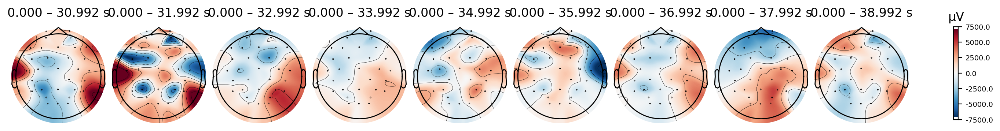

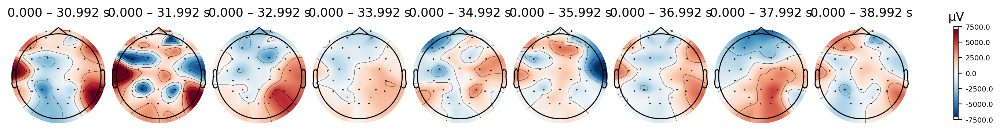

In [10]:
import numpy as np
raw_data = eeg_data[selected_channels,:]
evData_th = mne.EvokedArray(raw_data, info)
times = np.arange(0.05, 0.251, 0.04)
new_times = np.arange(1,10,1)
evData_th.filter(4, 8) 
evData_th.plot_topomap(times=new_times, ch_type='eeg', average=60, time_unit='s')

Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 8.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 9.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished


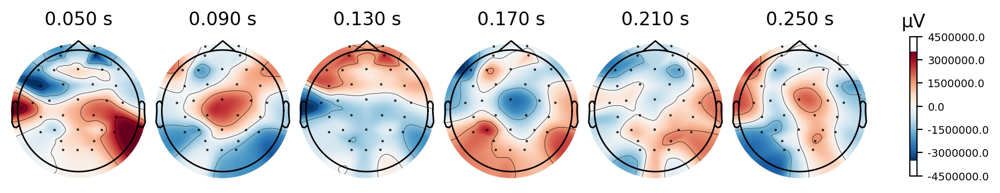

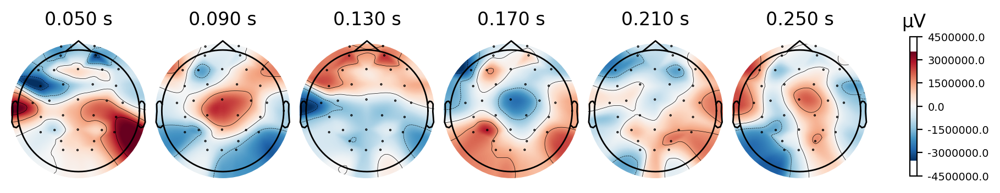

In [12]:
import numpy as np
import mne

# Assuming 'eeg_data', 'selected_channels', and 'info' are already defined
raw_data = eeg_data[selected_channels, :]
evData_th = mne.EvokedArray(raw_data, info)

# Update this line to create time points every 1 second from 1 to 30 seconds
#new_times = np.arange(1, 31, 1)  # Time points from 1 to 30 seconds, every 1 second

# Apply the filter for the Theta band (4-8 Hz)
evData_th.filter(4, 8) 

# Plot topographical maps at the specified new time points
evData_th.plot_topomap(times=times, ch_type='eeg', time_unit='s')


# for alpha band

Setting up band-pass filter from 8 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished


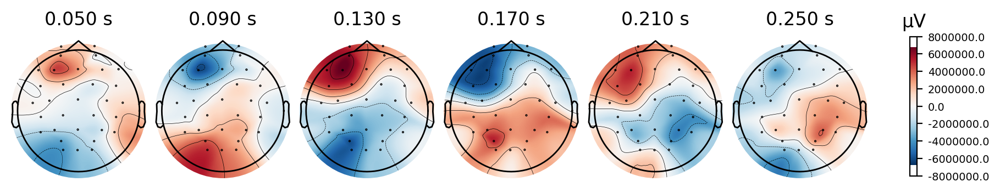

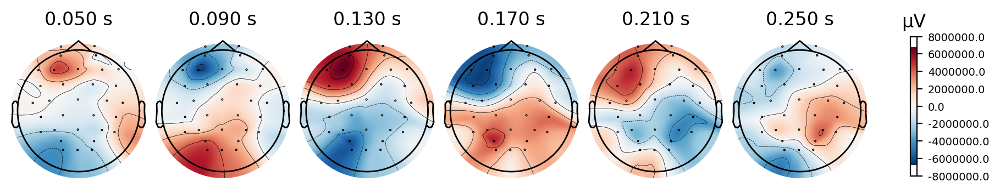

In [16]:
import numpy as np
import mne

# Assuming 'eeg_data', 'selected_channels', and 'info' are already defined
raw_data = eeg_data[selected_channels, :]
evData_al = mne.EvokedArray(raw_data, info)

# Update this line to create time points every 1 second from 1 to 30 seconds
#new_times = np.arange(1, 31, 1)  # Time points from 1 to 30 seconds, every 1 second

# Apply the filter for the alpha band (8-12 Hz)
evData_al.filter(8, 12) 

# Plot topographical maps at the specified new time points
evData_al.plot_topomap(times=times, ch_type='eeg', time_unit='s')


# for beta band. 

Setting up band-pass filter from 12 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 12.00
- Lower transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 10.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 141 samples (1.102 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished


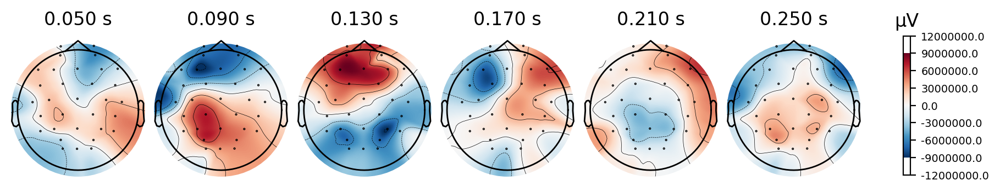

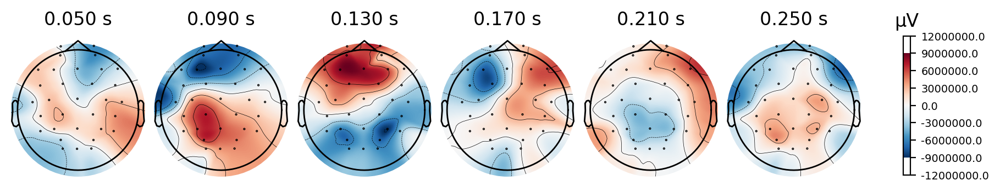

In [17]:
import numpy as np
import mne

# Assuming 'eeg_data', 'selected_channels', and 'info' are already defined
raw_data = eeg_data[selected_channels, :]
evData_bt = mne.EvokedArray(raw_data, info)

# Update this line to create time points every 1 second from 1 to 30 seconds
#new_times = np.arange(1, 31, 1)  # Time points from 1 to 30 seconds, every 1 second

# Apply the filter for the alpha band (12-30 Hz)
evData_bt.filter(12, 30) 

# Plot topographical maps at the specified new time points
evData_bt.plot_topomap(times=times, ch_type='eeg', time_unit='s')


# gamma band.

Setting up band-pass filter from 3 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 3.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 2.00 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished


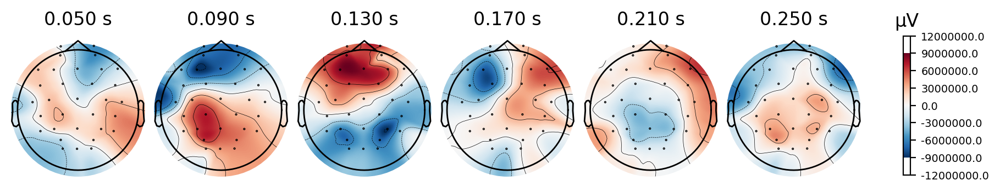

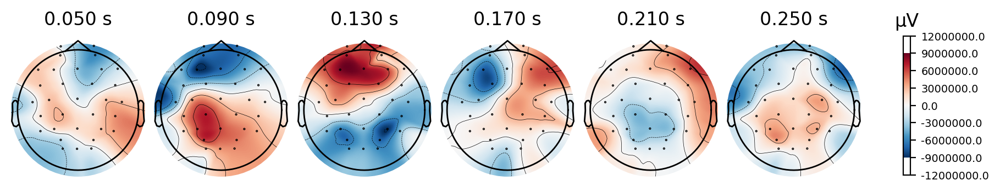

In [18]:
import numpy as np
import mne

# Assuming 'eeg_data', 'selected_channels', and 'info' are already defined
raw_data = eeg_data[selected_channels, :]
evData_gm = mne.EvokedArray(raw_data, info)

# Update this line to create time points every 1 second from 1 to 30 seconds
#new_times = np.arange(1, 31, 1)  # Time points from 1 to 30 seconds, every 1 second

# Apply the filter for the alpha band (30-45 Hz)
evData_gm.filter(3,45) 

# Plot topographical maps at the specified new time points
evData_bt.plot_topomap(times=times, ch_type='eeg', time_unit='s')


# creating a dataframe for the subject 0 data. 

In [25]:
# Assuming 'data' is your EEG dataset with the shape (40, 40, 8064)

# Selecting a specific trial (video)
trial_index = 0  # for example, the first trial (index 0)

# Extracting data for the selected trial
# This will give you a (40, 8064) array representing 40 channels and their data points
trial_data = data['data'][trial_index]

# If you only want the first 32 channels out of the 40 available
selected_channels_data = trial_data[:32]

# Now, 'selected_channels_data' is a (32, 8064) array


In [30]:
import pandas as pd

# Assuming 'selected_channels_data' is your data with shape (32, 8064)

# Creating a DataFrame
# Each row in the DataFrame will correspond to a channel
# Each column will correspond to a time point

df = pd.DataFrame(data=selected_channels_data.T, 
                  columns=[f'Channel_{i+1}' for i in range(selected_channels_data.shape[0])])

# Now, 'df' is a DataFrame where each column represents a channel and each row represents a time point


In [31]:
df

,Channel_1,Channel_2,Channel_3,Channel_4,Channel_5,Channel_6,Channel_7,Channel_8,Channel_9,Channel_10,...,Channel_23,Channel_24,Channel_25,Channel_26,Channel_27,Channel_28,Channel_29,Channel_30,Channel_31,Channel_32
0,0.948232,0.124707,-2.216511,1.005734,5.095919,1.206457,3.866461,1.861664,3.689008,1.319819,...,-0.548677,-1.371221,-4.726737,-1.875302,-5.650255,-4.108091,-2.270057,-3.557186,-1.237332,0.372271
1,1.653335,1.390083,2.292017,1.297927,5.000869,0.599485,3.280028,7.190648,4.701009,-3.853227,...,-0.137914,-4.653093,-8.181340,-4.465371,-6.247404,-5.307804,-3.833680,-1.260306,-0.941383,2.076195
2,3.013726,1.835099,2.746369,2.367689,4.176166,0.869299,0.656367,5.906498,1.712879,-6.444708,...,-0.252272,-4.519923,-6.856080,-4.639041,-7.388027,-4.743330,-2.973738,-3.099620,1.028047,4.465219
3,1.495061,-1.110738,-2.364459,-0.231850,0.354056,1.974166,-3.077413,-3.653504,-4.312704,-5.469621,...,0.685711,-0.132148,-1.742958,0.121536,-3.770098,-1.408069,1.555132,-1.586031,4.054683,5.917947
4,-1.264836,-2.590622,-2.309528,-1.662444,-4.154098,-0.091352,-2.857734,-1.045527,-4.377870,-2.554392,...,-1.605383,1.839121,1.246979,2.417382,2.829848,1.104115,2.644244,3.887943,3.616070,4.857952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059,5.582611,5.416049,6.221588,4.856169,0.298991,1.976263,2.746697,-0.021492,-0.269584,-3.748632,...,0.868640,-3.393682,0.030373,-1.087121,-2.417024,-3.298453,-5.717844,-3.607510,-4.124995,-4.321018
8060,2.171023,4.085006,4.290778,-0.038786,-0.268494,0.622648,2.022941,-8.021583,-1.091093,-3.084615,...,3.729457,-2.812774,-0.037885,0.898115,0.717744,-3.048182,-3.440970,2.042753,-2.583877,-1.167378
8061,-2.826489,-2.987021,-2.637078,-4.582649,-0.879462,-2.117416,-3.322173,-6.543766,-3.102136,-2.313458,...,1.337984,-1.062397,1.948767,6.586380,4.622979,-2.197430,3.393633,6.688860,2.640173,2.239585
8062,-4.477230,-6.287809,-7.406510,-4.403024,-2.608805,-3.706191,-4.181635,-2.678091,-1.968383,-0.150341,...,-2.451113,0.833602,3.366465,6.736387,5.113815,0.648745,7.888926,6.912321,6.574649,3.182566


In [32]:
df.describe()

,Channel_1,Channel_2,Channel_3,Channel_4,Channel_5,Channel_6,Channel_7,Channel_8,Channel_9,Channel_10,...,Channel_23,Channel_24,Channel_25,Channel_26,Channel_27,Channel_28,Channel_29,Channel_30,Channel_31,Channel_32
count,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,...,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000,8064.000000
mean,-0.028259,-0.015335,-0.003302,-0.056503,-0.028488,0.014347,-0.000252,-0.068311,-0.010738,0.040199,...,-0.000490,0.016750,0.022669,0.014557,0.036044,0.034916,0.024629,0.007397,0.012641,-0.011155
std,3.889663,4.214753,4.443984,4.338658,3.184293,3.196258,3.448796,4.877339,3.649397,2.763758,...,3.877537,2.815545,3.330763,4.473665,3.168977,2.676134,4.902262,3.672960,4.732653,4.376757
min,-21.300121,-23.446477,-23.234703,-31.335875,-13.840498,-16.225523,-17.436934,-29.445915,-15.300901,-11.902444,...,-16.371242,-12.101330,-21.655984,-26.028423,-15.441933,-11.803007,-28.806810,-17.445195,-21.678746,-19.507137
25%,-2.504674,-2.666712,-2.726162,-2.770246,-2.025174,-1.965610,-2.206308,-3.106816,-2.348474,-1.669267,...,-2.441487,-1.810324,-2.035304,-2.792284,-1.993958,-1.654144,-2.956466,-2.353354,-2.964023,-2.810518
50%,-0.009627,-0.047614,0.002327,-0.011645,-0.063182,0.002109,0.023528,-0.040502,-0.010798,0.039155,...,-0.024596,0.017002,0.024270,0.071789,0.061215,0.029003,0.041129,0.042513,0.006851,-0.000876
75%,2.473576,2.630169,2.785687,2.648906,1.975960,1.949106,2.220640,3.092165,2.312729,1.804233,...,2.453967,1.843983,2.165246,2.879104,2.040399,1.763851,3.005737,2.433303,3.027294,2.840750
max,16.481104,23.653793,25.902579,23.578724,17.378984,16.784073,21.534680,27.387360,24.489068,15.840119,...,23.684416,13.970506,15.995809,18.780344,14.222889,11.745021,33.466978,16.874498,27.557838,21.240975


In [ ]:
# plot the topographical maps according to the classes. 4 classes. 